## Lead scoring 


### Step 1: Importing Data

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Importing Pandas and NumPy
import pandas as pd, numpy as np

In [5]:
# Importing all datasets
data = pd.read_csv("Leads.csv")
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


### Step 2: Inspecting the Dataframe

In [7]:
# Let's check the dimensions of the dataframe
data.shape

(9240, 37)

In [9]:
# let's look at the statistical aspects of the dataframe
data.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [11]:
# Let's see the type of each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

### Step 3: Data Preparation

#### Converting some binary variables (Yes/No) to 0/1

In [13]:
# List of variables to map

varlist =  ['Do Not Email','Do Not Call','Get updates on DM Content','Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper','Digital Advertisement', 'Through Recommendations', 'I agree to pay the amount through cheque','A free copy of Mastering The Interview','Update me on Supply Chain Content','Receive More Updates About Our Courses']

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
data[varlist] = data[varlist].apply(binary_map)

In [16]:
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,...,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,...,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,...,0,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,...,0,Select,Mumbai,02.Medium,01.High,13.0,17.0,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,...,0,Select,Mumbai,02.Medium,01.High,15.0,18.0,0,0,Modified


#### For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [18]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy1 = pd.get_dummies(data[['Lead Origin', 'Last Activity', 'Country','Lead Source','Specialization','Last Notable Activity','What is your current occupation','What matters most to you in choosing a course','Tags','Lead Quality']],dtype=int)

# Adding the results to the master dataframe
data = pd.concat([data, dummy1], axis=1)

In [20]:
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Quality_High in Relevance,Lead Quality_Low in Relevance,Lead Quality_Might be,Lead Quality_Not Sure,Lead Quality_Worst
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,...,0,0,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,...,0,0,0,0,0,0,0,1,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,...,0,0,0,0,0,0,0,0,1,0
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,...,0,0,0,0,0,0,0,1,0,0


In [22]:
# Creating dummy variables for the remaining categorical variables and dropping the level with big names.

# Creating dummy variables for the variable 'LeadProfile'
ml = pd.get_dummies(data['Lead Profile'], prefix='LeadProfile',dtype=int)
# Dropping LeadProfile_Select column
ml1 = ml.drop(['LeadProfile_Select'], axis=1)
#Adding the results to the master dataframe
data = pd.concat([data,ml1], axis=1)

edu = pd.get_dummies(data['How did you hear about X Education'], prefix='How did you hear about X Education',dtype=int)
# Dropping LeadProfile_Select column
edu1 = edu.drop(['How did you hear about X Education_Select'], axis=1)
#Adding the results to the master dataframe
data = pd.concat([data,edu1], axis=1)

# Creating dummy variables for the variable 'City'.
os = pd.get_dummies(data['City'], prefix='City',dtype=int)
os1 = os.drop(['City_Select'], axis=1)
# Adding the results to the master dataframe
data = pd.concat([data,os1], axis=1)

aai = pd.get_dummies(data['Asymmetrique Activity Index'], prefix='Asymmetrique Activity Index',dtype=int)
# Adding the results to the master dataframe
data = pd.concat([data,aai], axis=1)

api = pd.get_dummies(data['Asymmetrique Profile Index'], prefix='Asymmetrique Profile Index',dtype=int)
# Adding the results to the master dataframe
data = pd.concat([data,api], axis=1)

In [24]:
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Asymmetrique Activity Index_01.High,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_03.Low,Asymmetrique Profile Index_01.High,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_03.Low
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,...,0,0,0,0,0,1,0,0,1,0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,...,0,0,0,0,0,1,0,0,1,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,...,0,0,0,0,0,1,0,1,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,...,0,0,0,0,0,1,0,1,0,0
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,...,0,0,0,0,0,1,0,1,0,0


#### Dropping the repeated variables

In [26]:
# We have created dummies for the below variables, so we can drop them
data = data.drop(['Lead Origin', 'Lead Source', 'Asymmetrique Activity Index', 'Asymmetrique Profile Index','Last Notable Activity','Lead Profile','City'], axis=1)

In [28]:
# We have created dummies for the below variables, so we can drop them
data = data.drop(['Last Activity', 'Country','Specialization','What is your current occupation','What matters most to you in choosing a course','Tags','Lead Quality','How did you hear about X Education'], axis=1)

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Columns: 204 entries, Prospect ID to Asymmetrique Profile Index_03.Low
dtypes: float64(4), int64(199), object(1)
memory usage: 14.4+ MB


Now you can see that you have all variables as numeric.

#### Checking for Outliers

In [33]:
# Checking for outliers in the continuous variables
num_data = data[['Asymmetrique Activity Score','Asymmetrique Profile Score']]

In [35]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
num_data.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,Asymmetrique Activity Score,Asymmetrique Profile Score
count,5022.000000,5022.000000
mean,14.306252,16.344883
std,1.386694,1.811395
min,7.000000,11.000000
25%,14.000000,15.000000
50%,14.000000,16.000000
75%,15.000000,18.000000
90%,16.000000,19.000000
95%,17.000000,20.000000
99%,17.000000,20.000000


From the distribution shown above, you can see that there no outliers in your data. The numbers are gradually increasing.

#### Checking for Missing Values and Inputing Them

In [37]:
# Adding up the missing values (column-wise)
data.isnull().sum()

Prospect ID                              0
Lead Number                              0
Do Not Email                             0
Do Not Call                              0
Converted                                0
                                        ..
Asymmetrique Activity Index_02.Medium    0
Asymmetrique Activity Index_03.Low       0
Asymmetrique Profile Index_01.High       0
Asymmetrique Profile Index_02.Medium     0
Asymmetrique Profile Index_03.Low        0
Length: 204, dtype: int64

In [39]:
# Checking the percentage of missing values
round(100*(data.isnull().sum()/len(data.index)), 2)

Prospect ID                              0.0
Lead Number                              0.0
Do Not Email                             0.0
Do Not Call                              0.0
Converted                                0.0
                                        ... 
Asymmetrique Activity Index_02.Medium    0.0
Asymmetrique Activity Index_03.Low       0.0
Asymmetrique Profile Index_01.High       0.0
Asymmetrique Profile Index_02.Medium     0.0
Asymmetrique Profile Index_03.Low        0.0
Length: 204, dtype: float64

Now we don't have any missing values

### Step 4: Test-Train Split

In [41]:
from sklearn.model_selection import train_test_split

In [43]:
# Putting feature variable to X
X = data.drop(['Converted','Prospect ID'], axis=1)

X.head()

,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,...,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Asymmetrique Activity Index_01.High,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_03.Low,Asymmetrique Profile Index_01.High,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_03.Low
0,660737,0,0,0.0,0,0.0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
1,660728,0,0,5.0,674,2.5,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,660727,0,0,2.0,1532,2.0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
3,660719,0,0,1.0,305,1.0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,660681,0,0,2.0,1428,1.0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [45]:
# Putting response variable to y
y = data['Converted']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [47]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

### Step 5: Feature Scaling

In [49]:
from sklearn.preprocessing import StandardScaler

In [51]:
scaler = StandardScaler()

X_train[['Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['Total Time Spent on Website','Page Views Per Visit']])

X_train.head()

,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,...,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Asymmetrique Activity Index_01.High,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_03.Low,Asymmetrique Profile Index_01.High,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_03.Low
1871,641410,0,0,0.0,-0.885371,-1.079876,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
6795,597687,0,0,4.0,0.005716,-0.469529,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3516,626825,0,0,5.0,-0.691418,0.067394,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8105,587928,0,0,5.0,1.365219,1.214664,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
3934,622366,0,0,0.0,-0.885371,-1.079876,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
### Checking the Converted Rate
converted = (sum(data['Converted'])/len(data['Converted'].index))*100
converted

38.53896103896104

### We have almost 38% conversion rate

### Step 6: Looking at Correlations

In [55]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
# Let's see the correlation matrix 
plt.figure(figsize = (40,20))        # Size of the figure
data_numeric = data.select_dtypes(include=['number'])

sns.heatmap(data_numeric.corr(),annot = True)
plt.show()

#### Dropping highly correlated dummy variables

In [59]:
X_test = X_test.drop(['Get updates on DM Content','Receive More Updates About Our Courses','Magazine','A free copy of Mastering The Interview'], axis=1)
X_train = X_train.drop(['Get updates on DM Content','Receive More Updates About Our Courses','Magazine','A free copy of Mastering The Interview'], axis=1)

#### Checking the Correlation Matrix

After dropping highly correlated variables now let's check the correlation matrix again.

In [ ]:
plt.figure(figsize = (60,30))
data_numeric = X_train.select_dtypes(include=['number'])

sns.heatmap(data_numeric.corr(),annot = True)
plt.show()

In [61]:
X_test = X_test.drop(['I agree to pay the amount through cheque','Update me on Supply Chain Content'], axis=1)
X_train = X_train.drop(['I agree to pay the amount through cheque','Update me on Supply Chain Content'], axis=1)

In [63]:
X_test = X_test.drop(['Lead Source_testone','Last Notable Activity_Approached upfront','Country_Italy','Country_Sri Lanka','Country_Switzerland'], axis=1)
X_train = X_train.drop(['Lead Source_testone','Last Notable Activity_Approached upfront','Country_Italy','Country_Sri Lanka','Country_Switzerland'], axis=1)

In [ ]:
plt.figure(figsize = (60,30))
data_numeric = X_train.select_dtypes(include=['number'])
sns.heatmap(data_numeric.corr(),annot = True)
plt.show()

In [67]:
X_test = X_test.drop(['Country_Tanzania','Country_Liberia'], axis=1)
X_train = X_train.drop(['Country_Tanzania','Country_Liberia'], axis=1)

In [69]:
X_test = X_test.drop(['Last Notable Activity_View in browser link Clicked'], axis=1)
X_train = X_train.drop(['Last Notable Activity_View in browser link Clicked'], axis=1)

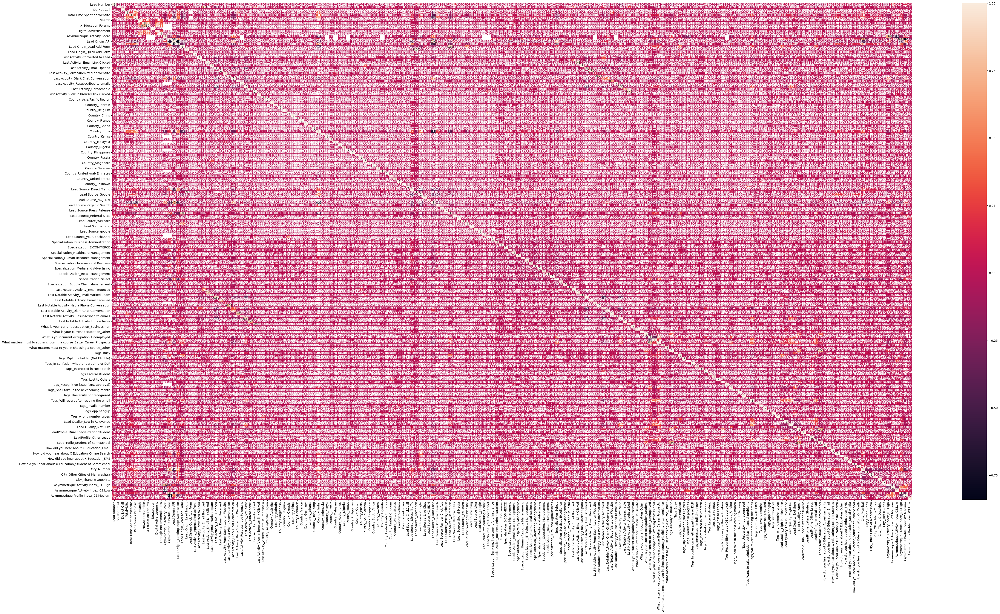

In [72]:
plt.figure(figsize = (60,30))
data_numeric = X_train.select_dtypes(include=['number'])
sns.heatmap(data_numeric.corr(),annot = True)
plt.show()

### Step 7: Model Building
Let's start by splitting our data into a training set and a test set.

#### Running Your First Training Model

In [74]:
import statsmodels.api as sm

In [76]:
print(X_train.isnull().sum())
print(y_train.isnull().sum())

Lead Number                               0
Do Not Email                              0
Do Not Call                               0
TotalVisits                              99
Total Time Spent on Website               0
                                         ..
Asymmetrique Activity Index_02.Medium     0
Asymmetrique Activity Index_03.Low        0
Asymmetrique Profile Index_01.High        0
Asymmetrique Profile Index_02.Medium      0
Asymmetrique Profile Index_03.Low         0
Length: 188, dtype: int64
0


In [78]:
X_train_clean = X_train.dropna()
y_train_clean = y_train[X_train_clean.index]  # Keep alignment


In [80]:
# Logistic regression model
logm1 = sm.GLM(y_train_clean, sm.add_constant(X_train_clean), family=sm.families.Binomial())
result = logm1.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3429
Model:                            GLM   Df Residuals:                     3260
Model Family:                Binomial   Df Model:                          168
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -663.54
Date:                Thu, 26 Jun 2025   Deviance:                       1223.7
Time:                        11:46:00   Pearson chi2:                 1.35e+16
No. Iterations:                    25   Pseudo R-squ. (CS):             0.6058
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                      37.2090   7.94e+04      0.000      1.000   -1.56e+05    1.56e+05
Lead Number                                                              3.334e-06    3.5e-06      0.953      0.341   -3.52e-06    1.02e-05
Do Not Email                                                               -1.1605      0.599     -1.939      0.053      -2.334       0.013
Do Not Call                                                                20.3619   1.93e+05      0.000      1.000   -3.78e+05    3.78e+05
TotalVisits                                                                -0.0461      0.041     -1.139      0.255      -0.126       0.033
Total Time Spent on Website                                                 1.0286      0.107      9.608      0.000       0.819       1.238
Page Views Per Visit                                                       -0.0400      0.135     -0.298      0.766      -0.304       0.224
Search                                                                      1.6109      1.531      1.052      0.293      -1.389       4.611
Newspaper Article                                                          22.2461   3.59e+05    6.2e-05      1.000   -7.03e+05    7.03e+05
X Education Forums                                                      -1.501e-08      0.000     -0.000      1.000      -0.000       0.000
Newspaper                                                                1.584e-08      0.000   7.52e-05      1.000      -0.000       0.000
Digital Advertisement                                                     -24.8988    3.9e+05  -6.38e-05      1.000   -7.65e+05    7.65e+05
Through Recommendations                                                    20.8188   1.93e+05      0.000      1.000   -3.79e+05    3.79e+05
Asymmetrique Activity Score                                                 1.4284      0.164      8.686      0.000       1.106       1.751
Asymmetrique Profile Score                                                 -0.5126      0.531     -0.965      0.334      -1.553       0.528
Lead Origin_API                                                            34.8464   1.64e+05      0.000      1.000   -3.21e+05    3.21e+05
Lead Origin_Landing Page Submission                                        36.0345   1.64e+05      0.000      1.000   -3.21e+05    3.21e+05
Lead Origin_Lead Add Form                                                 -70.4185   1.37e+05     -0.001      1.000   -2.69e+05    2.69e+05
Lead Origin_Lead Import                                                    36.7471   3.03e+05      0.000      1.000   -5.95e+05    5.95e+05
Lea

### Step 8: Feature Selection Using RFE

In [82]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [84]:

from sklearn.feature_selection import RFE

rfe = RFE(estimator=logreg, n_features_to_select=15)
rfe = rfe.fit(X_train_clean, y_train_clean)
# running RFE with 15 variables as output


In [86]:
rfe.support_

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [88]:
list(zip(X_train_clean.columns, rfe.support_, rfe.ranking_))

[('Lead Number', False, 159),
 ('Do Not Email', False, 5),
 ('Do Not Call', False, 114),
 ('TotalVisits', False, 155),
 ('Total Time Spent on Website', False, 13),
 ('Page Views Per Visit', False, 113),
 ('Search', False, 62),
 ('Newspaper Article', False, 132),
 ('X Education Forums', False, 174),
 ('Newspaper', False, 161),
 ('Digital Advertisement', False, 60),
 ('Through Recommendations', False, 129),
 ('Asymmetrique Activity Score', False, 10),
 ('Asymmetrique Profile Score', False, 38),
 ('Lead Origin_API', False, 28),
 ('Lead Origin_Landing Page Submission', False, 26),
 ('Lead Origin_Lead Add Form', False, 33),
 ('Lead Origin_Lead Import', False, 27),
 ('Lead Origin_Quick Add Form', False, 162),
 ('Last Activity_Approached upfront', False, 128),
 ('Last Activity_Converted to Lead', False, 29),
 ('Last Activity_Email Bounced', False, 70),
 ('Last Activity_Email Link Clicked', False, 139),
 ('Last Activity_Email Marked Spam', False, 156),
 ('Last Activity_Email Opened', False, 84

In [90]:
logreg.fit(X_train_clean, y_train_clean)
coeffs = pd.Series(logreg.coef_[0], index=X_train_clean.columns)
odds_ratios = np.exp(coeffs)
top_features = odds_ratios.abs().sort_values(ascending=False)
print("Top 3 variables contributing to lead conversion:\n")
print(top_features.head(3))

Top 3 variables contributing to lead conversion:

Total Time Spent on Website                                              4.926522
Tags_Will revert after reading the email                                 3.946546
What matters most to you in choosing a course_Better Career Prospects    2.021536
dtype: float64


In [92]:
col = X_train_clean.columns[rfe.support_]

In [94]:
X_train_clean.columns[~rfe.support_]

Index(['Lead Number', 'Do Not Email', 'Do Not Call', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       ...
       'City_Other Cities of Maharashtra', 'City_Other Metro Cities',
       'City_Thane & Outskirts', 'City_Tier II Cities',
       'Asymmetrique Activity Index_01.High',
       'Asymmetrique Activity Index_02.Medium',
       'Asymmetrique Activity Index_03.Low',
       'Asymmetrique Profile Index_01.High',
       'Asymmetrique Profile Index_02.Medium',
       'Asymmetrique Profile Index_03.Low'],
      dtype='object', length=173)

##### Assessing the model with StatsModels

In [96]:
X_train_sm = sm.add_constant(X_train_clean[col])
logm2 = sm.GLM(y_train_clean,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3429
Model:                            GLM   Df Residuals:                     3413
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -803.69
Date:                Thu, 26 Jun 2025   Deviance:                       1607.4
Time:                        11:47:03   Pearson chi2:                 3.31e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.5723
Covariance Type:            nonrobust                                         
=========================================================================================================================================
                                                                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------------
const                                                                    -2.2239      0.109    -20.481      0.000      -2.437      -2.011
Lead Source_Welingak Website                                              2.5197      0.737      3.420      0.001       1.076       3.964
What matters most to you in choosing a course_Better Career Prospects     2.4513      0.151     16.257      0.000       2.156       2.747
Tags_Already a student                                                  -25.7934   1.67e+04     -0.002      0.999   -3.28e+04    3.27e+04
Tags_Closed by Horizzon                                                  25.2896   1.89e+04      0.001      0.999    -3.7e+04    3.71e+04
Tags_Diploma holder (Not Eligible)                                      -25.7934   5.09e+04     -0.001      1.000   -9.98e+04    9.98e+04
Tags_Interested  in full time MBA                                        -3.5045      0.728     -4.814      0.000      -4.931      -2.078
Tags_Interested in other courses                                         -4.2613      0.515     -8.274      0.000      -5.271      -3.252
Tags_Lost to EINS                                                         4.8515      0.735      6.597      0.000       3.410       6.293
Tags_Not doing further education                                         -4.3049      1.014     -4.246      0.000      -6.292      -2.318
Tags_Ringing                                                             -3.5403      0.283    -12.509      0.000      -4.095      -2.986
Tags_Will revert after reading the email                                  3.1279      0.229     13.665      0.000       2.679       3.577
Tags_invalid number                                                      -3.6613      1.021     -3.585      0.000      -5.663      -1.659
Tags_number not provided                                                -25.7934   6.51e+04     -0.000      1.000   -1.28e+05    1.28e+05
Tags_switched off                                                        -3.3297      0.522     -6.382      0.000      -4.352      -2.307
Tags_wrong number given                                                 -25.7934    5.4e+04     -0.000      1.000   -1.06e+05    1.06e+05
=========================================================================================================================================
"""

In [98]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

1871    0.035129
8105    0.035129
987     0.097623
7423    0.966277
1032    0.556594
712     0.035129
3677    0.097623
1050    0.966277
9115    0.966277
2878    1.000000
dtype: float64

In [100]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.03512881, 0.03512881, 0.09762338, 0.96627693, 0.5565936 ,
       0.03512881, 0.09762338, 0.96627693, 0.96627693, 1.        ])

##### Creating a dataframe with the actual converted flag and the predicted probabilities

In [102]:
y_train_pred_final = pd.DataFrame({'Converted':y_train_clean.values, 'Convert_Prob':y_train_pred})
y_train_pred_final['Prospect ID'] = y_train_clean.index
y_train_pred_final.head()

,Converted,Convert_Prob,Prospect ID
0,0,0.035129,1871
1,0,0.035129,8105
2,0,0.097623,987
3,1,0.966277,7423
4,1,0.556594,1032


##### Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0

In [104]:
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Convert_Prob,Prospect ID,predicted
0,0,0.035129,1871,0
1,0,0.035129,8105,0
2,0,0.097623,987,0
3,1,0.966277,7423,1
4,1,0.556594,1032,1


In [106]:
from sklearn import metrics

In [108]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion)

[[1970  190]
 [ 119 1150]]


In [110]:
# Predicted     not_converted    converted
# Actual
# not_converted        1970      190
# converted           119       1150  

In [112]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.9098862642169728


#### Checking VIFs

In [114]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [116]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_clean[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_clean[col].values, i) for i in range(X_train_clean[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,What matters most to you in choosing a course_...,5.91
10,Tags_Will revert after reading the email,2.80
9,Tags_Ringing,2.04
6,Tags_Interested in other courses,1.51
2,Tags_Already a student,1.41
3,Tags_Closed by Horizzon,1.30
13,Tags_switched off,1.23
8,Tags_Not doing further education,1.15
5,Tags_Interested in full time MBA,1.13
11,Tags_invalid number,1.08


There are a few variables with high VIF. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex. The variable 'What matters most to you in choosing a course_Better Career Prospects' has the highest VIF. So let's start by dropping that.

In [118]:
col = col.drop('What matters most to you in choosing a course_Better Career Prospects', 1)
col

Index(['Lead Source_Welingak Website', 'Tags_Already a student',
       'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_switched off',
       'Tags_wrong number given'],
      dtype='object')

In [120]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train_clean[col])
logm3 = sm.GLM(y_train_clean,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3429
Model:                            GLM   Df Residuals:                     3414
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -952.71
Date:                Thu, 26 Jun 2025   Deviance:                       1905.4
Time:                        11:50:47   Pearson chi2:                 3.08e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.5334
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.2393      0.066    -18.838      0.000      -1.368      -1.110
Lead Source_Welingak Website                 3.9818      0.732      5.436      0.000       2.546       5.417
Tags_Already a student                     -24.3268   1.67e+04     -0.001      0.999   -3.28e+04    3.27e+04
Tags_Closed by Horizzon                     26.7286   1.87e+04      0.001      0.999   -3.65e+04    3.66e+04
Tags_Diploma holder (Not Eligible)         -24.3268   5.09e+04     -0.000      1.000   -9.98e+04    9.98e+04
Tags_Interested  in full time MBA           -2.0379      0.723     -2.817      0.005      -3.456      -0.620
Tags_Interested in other courses            -2.8798      0.508     -5.665      0.000      -3.876      -1.883
Tags_Lost to EINS                            4.7053      0.721      6.525      0.000       3.292       6.119
Tags_Not doing further education            -2.8383      1.011     -2.809      0.005      -4.819      -0.858
Tags_Ringing                                -2.0737      0.271     -7.653      0.000      -2.605      -1.543
Tags_Will revert after reading the email     4.5942      0.214     21.485      0.000       4.175       5.013
Tags_invalid number                         -2.1947      1.018     -2.156      0.031      -4.190      -0.199
Tags_number not provided                   -24.3268   6.51e+04     -0.000      1.000   -1.28e+05    1.28e+05
Tags_switched off                           -1.8631      0.515     -3.615      0.000      -2.873      -0.853
Tags_wrong number given                    -24.3268    5.4e+04     -0.000      1.000   -1.06e+05    1.06e+05
============================================================================================================
"""

In [122]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [124]:
y_train_pred[:10]

array([0.03512881, 0.03512881, 0.22456429, 0.96626532, 0.22456429,
       0.03512881, 0.22456429, 0.96626532, 0.96626532, 1.        ])

In [126]:
y_train_pred_final['Convert_Prob'] = y_train_pred

In [128]:
# Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Convert_Prob,Prospect ID,predicted
0,0,0.035129,1871,0
1,0,0.035129,8105,0
2,0,0.224564,987,0
3,1,0.966265,7423,1
4,1,0.224564,1032,0


In [130]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.8967629046369204


So overall the accuracy hasn't dropped much.

##### Let's check the VIFs again

In [132]:
vif = pd.DataFrame()
vif['Features'] = X_train_clean[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_clean[col].values, i) for i in range(X_train_clean[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Lead Source_Welingak Website,1.0
1,Tags_Already a student,1.0
2,Tags_Closed by Horizzon,1.0
3,Tags_Diploma holder (Not Eligible),1.0
4,Tags_Interested in full time MBA,1.0
5,Tags_Interested in other courses,1.0
6,Tags_Lost to EINS,1.0
7,Tags_Not doing further education,1.0
8,Tags_Ringing,1.0
9,Tags_Will revert after reading the email,1.0


All variables have a good value of VIF. So we need not drop any more variables and we can proceed with making predictions using this model only

In [134]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
confusion

array([[2131,   29],
       [ 325,  944]])

In [136]:
# Actual/Predicted     not_converted    converted
        # not_converted        2131      29
        # converted            325       944  

In [138]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.8967629046369204

In [140]:
logreg.fit(X_train_clean, y_train_clean)
coeffs = pd.Series(logreg.coef_[0], index=X_train_clean.columns)
odds_ratios = np.exp(coeffs)
top_features = odds_ratios.abs().sort_values(ascending=False)
print("Top 3 variables contributing to lead conversion:\n")
print(top_features.head(3))

Top 3 variables contributing to lead conversion:

Total Time Spent on Website                                              4.926522
Tags_Will revert after reading the email                                 3.946546
What matters most to you in choosing a course_Better Career Prospects    2.021536
dtype: float64


In [ ]:
## Extract Coefficients for Dummy Variables

In [142]:
coeff_series = pd.Series(logreg.coef_[0], index=X_train_clean.columns)
dummy_vars = coeff_series[X_train.columns.str.contains('_')]
top_3_categorical = dummy_vars.abs().sort_values(ascending=False).head(3)
print("Top 3 categorical variables impacting lead conversion:")
print(top_3_categorical)

Top 3 categorical variables impacting lead conversion:
Tags_Will revert after reading the email                                 1.372841
What matters most to you in choosing a course_Better Career Prospects    0.703858
Lead Quality_Might be                                                    0.633970
dtype: float64


### Step 9: Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [144]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [146]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Convert_Prob, drop_intermediate = False )

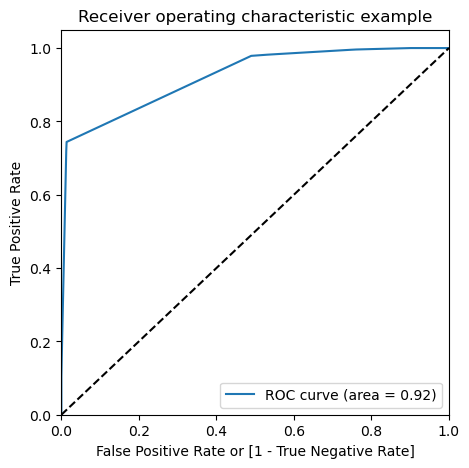

In [148]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Convert_Prob)

### Step 10: Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [150]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Convert_Prob,Prospect ID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.035129,1871,0,1,0,0,0,0,0,0,0,0,0
1,0,0.035129,8105,0,1,0,0,0,0,0,0,0,0,0
2,0,0.224564,987,0,1,1,1,0,0,0,0,0,0,0
3,1,0.966265,7423,1,1,1,1,1,1,1,1,1,1,1
4,1,0.224564,1032,0,1,1,1,0,0,0,0,0,0,0


In [152]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.370079  1.000000  0.000000
0.1   0.1  0.683581  0.978723  0.510185
0.2   0.2  0.683581  0.978723  0.510185
0.3   0.3  0.896763  0.743893  0.986574
0.4   0.4  0.896763  0.743893  0.986574
0.5   0.5  0.896763  0.743893  0.986574
0.6   0.6  0.896763  0.743893  0.986574
0.7   0.7  0.896763  0.743893  0.986574
0.8   0.8  0.896763  0.743893  0.986574
0.9   0.9  0.896763  0.743893  0.986574


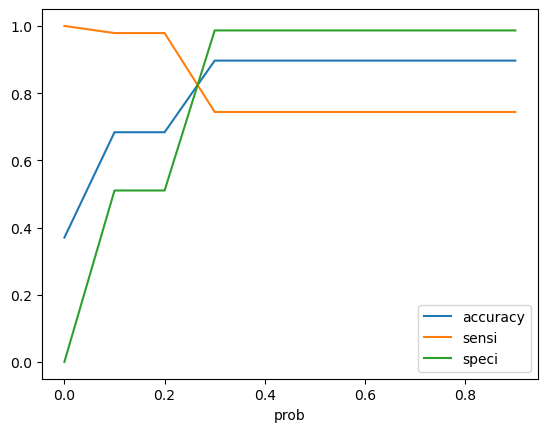

In [154]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.25 is the optimum point to take it as a cutoff probability.

In [156]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Convert_Prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Converted,Convert_Prob,Prospect ID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.035129,1871,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.035129,8105,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.224564,987,0,1,1,1,0,0,0,0,0,0,0,0
3,1,0.966265,7423,1,1,1,1,1,1,1,1,1,1,1,1
4,1,0.224564,1032,0,1,1,1,0,0,0,0,0,0,0,0


In [158]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8967629046369204

In [160]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[2131,   29],
       [ 325,  944]])

Using sklearn utilities for the same

In [162]:
from sklearn.metrics import precision_score, recall_score

In [164]:
precision_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.9701952723535457

In [166]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.7438928289992119

### Precision and recall tradeoff

In [168]:
from sklearn.metrics import precision_recall_curve

In [170]:
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       0
 1       0
 2       0
 3       1
 4       1
        ..
 3424    1
 3425    0
 3426    1
 3427    1
 3428    1
 Name: Converted, Length: 3429, dtype: int64,
 0       0
 1       0
 2       0
 3       1
 4       0
        ..
 3424    1
 3425    0
 3426    1
 3427    1
 3428    0
 Name: predicted, Length: 3429, dtype: int64)

In [172]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Convert_Prob)

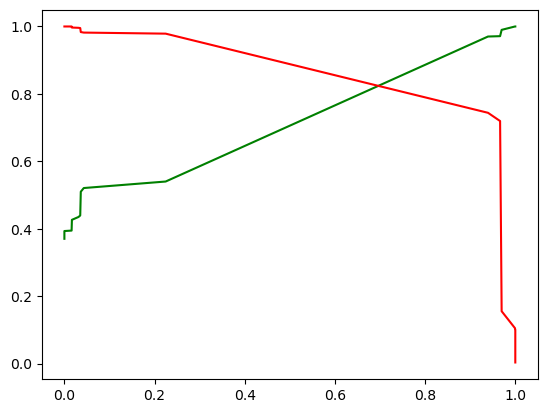

In [174]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [176]:
###choose a threshold where recall is high and precision is still acceptable.